# IMPORTING MODULE

In [1]:
!pip install folium

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings
warnings.filterwarnings("ignore")

# IMPORT THE DATASET

In [3]:
df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding = 'latin1')
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


# BASIC CHECK

In [4]:
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [6]:
df.dtypes

eventid        int64
iyear          int64
imonth         int64
iday           int64
approxdate    object
               ...  
INT_LOG        int64
INT_IDEO       int64
INT_MISC       int64
INT_ANY        int64
related       object
Length: 135, dtype: object

In [7]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [8]:
df.columns.values

array(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region', 'region_txt',
       'provstate', 'city', 'latitude', 'longitude', 'specificity',
       'vicinity', 'location', 'summary', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'alternative', 'alternative_txt', 'multiple',
       'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'targtype2',
       'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2',
       'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt',
       'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3',
       'natlty3_txt', 'gname', 'gsubname', 'gname2', 'gsubname2',
       'gname3', 'gsubname3', 'motive', 'guncertain1', 'guncertain2',
       'guncertain3', 'in

In [9]:
df.rename(columns={'iyear':'Year','imonth':'Month','iday':"day",'gname':'Group','country_txt':'Country','region_txt':'Region','provstate':'State','city':'City','latitude':'latitude',
    'longitude':'longitude','summary':'summary','attacktype1_txt':'Attacktype','targtype1_txt':'Targettype','weaptype1_txt':'Weapon','nkill':'kill',
     'nwound':'Wound'},inplace=True)

data = df[['Year','Month','day','Country','State','Region','City','latitude','longitude',"Attacktype",'kill',
               'Wound','target1','summary','Group','Targettype','Weapon','motive']]

In [10]:
data.head()

,Year,Month,day,Country,State,Region,City,latitude,longitude,Attacktype,kill,Wound,target1,summary,Group,Targettype,Weapon,motive
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN


# DATA PREPROCESSING

In [11]:
data.isnull().sum()

Year               0
Month              0
day                0
Country            0
State            421
Region             0
City             434
latitude        4556
longitude       4557
Attacktype         0
kill           10313
Wound          16311
target1          636
summary        66129
Group              0
Targettype         0
Weapon             0
motive        131130
dtype: int64

In [12]:
data['Wound'] = data['Wound'].fillna(0)
data['kill'] = data['kill'].fillna(0)
data['Casualties'] = data['Wound'] + data['kill']

In [13]:
data.describe()

,Year,Month,day,latitude,longitude,kill,Wound,Casualties
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181691.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02,2.266860,2.883296,5.150156
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05,11.227057,34.309747,40.555416
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000,0.000000
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000,0.000000
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000,1.000000
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000,4.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000,9574.000000


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Year        181691 non-null  int64  
 1   Month       181691 non-null  int64  
 2   day         181691 non-null  int64  
 3   Country     181691 non-null  object 
 4   State       181270 non-null  object 
 5   Region      181691 non-null  object 
 6   City        181257 non-null  object 
 7   latitude    177135 non-null  float64
 8   longitude   177134 non-null  float64
 9   Attacktype  181691 non-null  object 
 10  kill        181691 non-null  float64
 11  Wound       181691 non-null  float64
 12  target1     181055 non-null  object 
 13  summary     115562 non-null  object 
 14  Group       181691 non-null  object 
 15  Targettype  181691 non-null  object 
 16  Weapon      181691 non-null  object 
 17  motive      50561 non-null   object 
 18  Casualties  181691 non-null  float64
dtypes:

In [15]:
data.describe(include = 'O')

,Country,State,Region,City,Attacktype,target1,summary,Group,Targettype,Weapon,motive
count,181691,181270,181691,181257,181691,181055,115562,181691,181691,181691,50561
unique,205,2855,12,36674,9,86006,112492,3537,22,12,14490
top,Iraq,Baghdad,Middle East & North Africa,Unknown,Bombing/Explosion,Civilians,"09/00/2016: Sometime between September 18, 201...",Unknown,Private Citizens & Property,Explosives,Unknown
freq,24636,7645,50474,9775,88255,6461,100,82782,43511,92426,14889


In [16]:
data['Country'].value_counts().index[0]

'Iraq'

In [17]:
data['City'].value_counts().index[1]

'Baghdad'

# EDA

In [18]:
pd.DataFrame({'Title': ['Country with most attacks','City with most attacks',"Region with the most attacks",
                            "Year with the most attacks","Month with the most attacks",
                            "Group with the most attacks","Most Attack Types"],
                  'Values' : [str(df['Country'].value_counts().index[0]),str(df['City'].value_counts().index[1]),
                              str(df['Region'].value_counts().index[0]),str(df['Year'].value_counts().index[0]),
                              str(df['Month'].value_counts().index[0]),str(df['Group'].value_counts().index[1]),
                              str(df['Attacktype'].value_counts().index[0])]})

,Title,Values
0,Country with most attacks,Iraq
1,City with most attacks,Baghdad
2,Region with the most attacks,Middle East & North Africa
3,Year with the most attacks,2014
4,Month with the most attacks,5
5,Group with the most attacks,Taliban
6,Most Attack Types,Bombing/Explosion


In [19]:
data.corr()

,Year,Month,day,latitude,longitude,kill,Wound,Casualties
Year,1.000000,0.000139,0.018254,0.166933,0.003917,0.021252,0.017484,0.020675
Month,0.000139,1.000000,0.005497,-0.015978,-0.003880,0.004031,0.003178,0.003805
day,0.018254,0.005497,1.000000,0.003423,-0.002285,-0.003225,-0.001082,-0.001808
latitude,0.166933,-0.015978,0.003423,1.000000,0.001463,-0.013170,0.015920,0.009899
longitude,0.003917,-0.003880,-0.002285,0.001463,1.000000,-0.000587,0.000205,0.000013
kill,0.021252,0.004031,-0.003225,-0.013170,-0.000587,1.000000,0.443326,0.651885
Wound,0.017484,0.003178,-0.001082,0.015920,0.000205,0.443326,1.000000,0.968724
Casualties,0.020675,0.003805,-0.001808,0.009899,0.000013,0.651885,0.968724,1.000000


[Text(0.5, 23.52222222222222, ' '), Text(50.722222222222214, 0.5, ' ')]

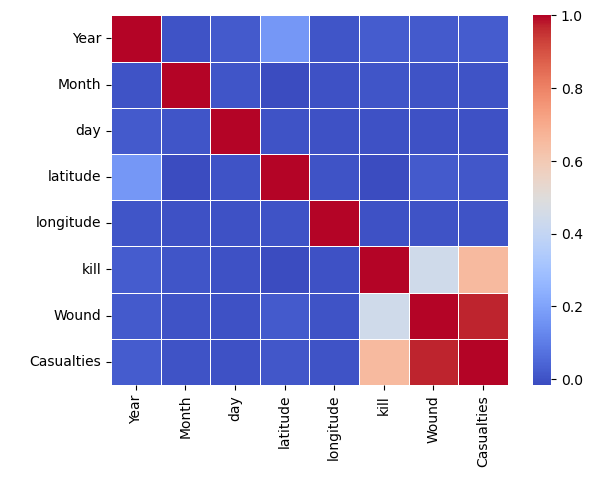

In [20]:
ax = sns.heatmap(data.corr(), cmap = 'coolwarm', linewidth = .5)
ax.set(xlabel=" ", ylabel=" ")

# ATTACKS IN YEARS

In [21]:
attacks = data['Year'].value_counts(dropna = False).sort_index().to_frame().reset_index().rename(columns = {'index' : 'Year','Year':'Attacks'})
attacks.head(8)

,Year,Attacks
0,1970,651
1,1971,471
2,1972,568
3,1973,473
4,1974,581
5,1975,740
6,1976,923
7,1977,1319


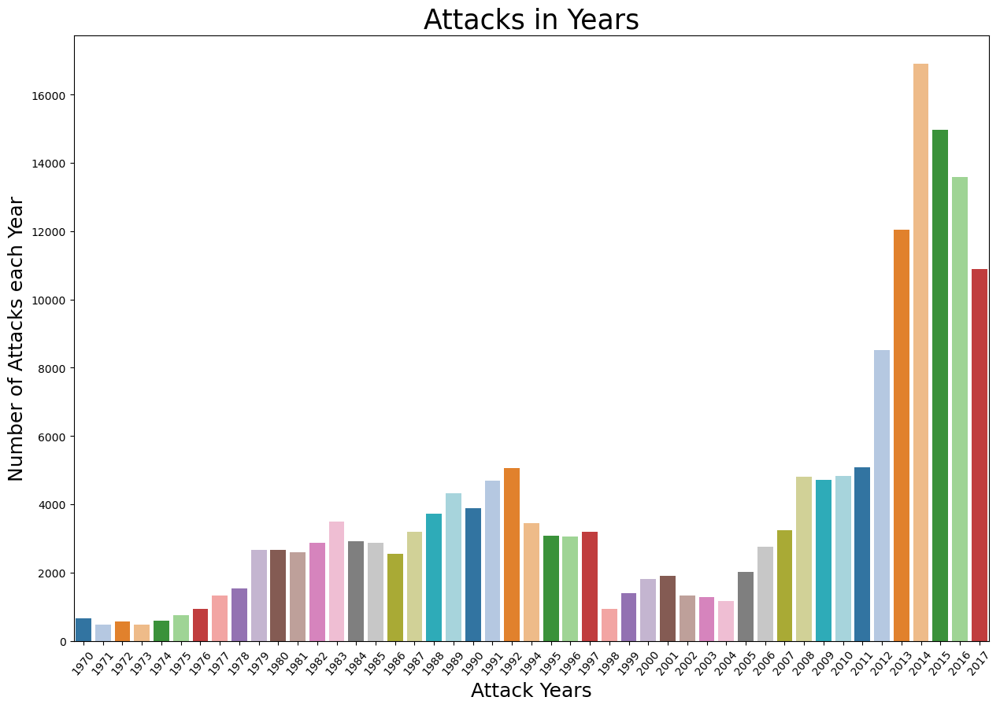

In [22]:
year = data['Year'].unique()
years_count = data['Year'].value_counts(dropna = False).sort_index()
plt.figure(figsize = (15,10))
sns.barplot(x = year,
            y = years_count,
            palette = 'tab20')
plt.xlabel("Attack Years", fontsize = 18)
plt.ylabel('Number of Attacks each Year', fontsize = 18)
plt.xticks(rotation = 50)
plt.title('Attacks in Years', fontsize =25)
plt.show()

## Insights:
### (1). Most no of attacks made in 2014
### (2). Least no of attacks made in 1971

# REGION WISE ATTACKS

In [23]:
region = pd.crosstab(data.Year,data.Region)
region.head()

Region,Australasia & Oceania,Central America & Caribbean,Central Asia,East Asia,Eastern Europe,Middle East & North Africa,North America,South America,South Asia,Southeast Asia,Sub-Saharan Africa,Western Europe
Year,,,,,,,,,,,,
1970,1,7,0,2,12,28,472,65,1,10,3,50
1971,1,5,0,1,5,55,247,24,0,6,2,125
1972,8,3,0,0,1,53,73,33,1,16,4,376
1973,1,6,0,2,1,19,64,83,1,2,4,290
1974,1,11,0,4,2,42,111,81,2,3,7,317


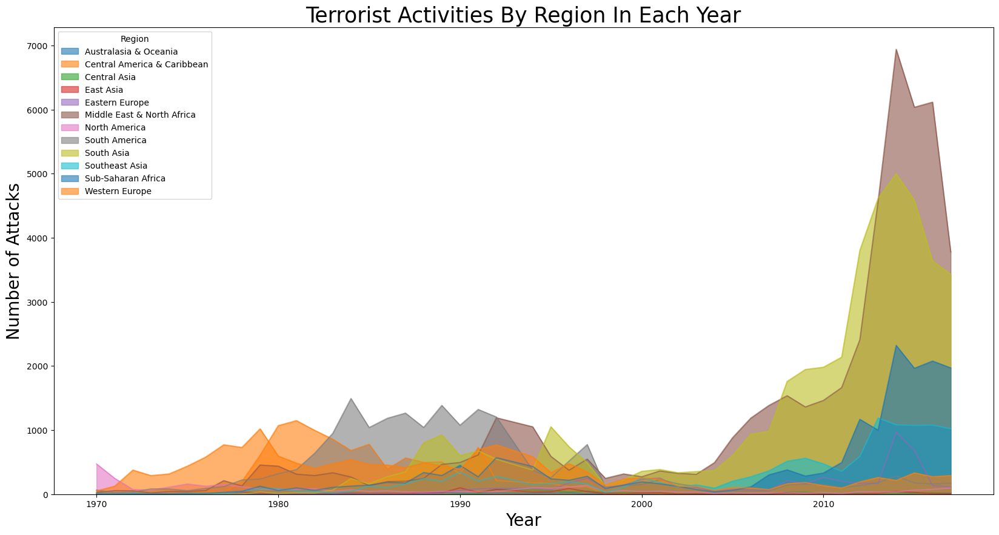

In [24]:
region.plot(kind = 'area', stacked = False, alpha = 0.6, figsize = (20,10))
plt.title('Terrorist Activities By Region In Each Year',fontsize=25)
plt.ylabel('Number of Attacks',fontsize=20)
plt.xlabel("Year",fontsize=20)
plt.show()

# INSIGHTS :
### (1). Attack done in between 1970 and 2017
### (2). Highest attacks made in Middle East & North Africa

# COUNTRY WISE ATTACKS

In [25]:
cy = data['Country'].value_counts().head(12)
cy

Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Somalia            4142
Nigeria            3907
Name: Country, dtype: int64

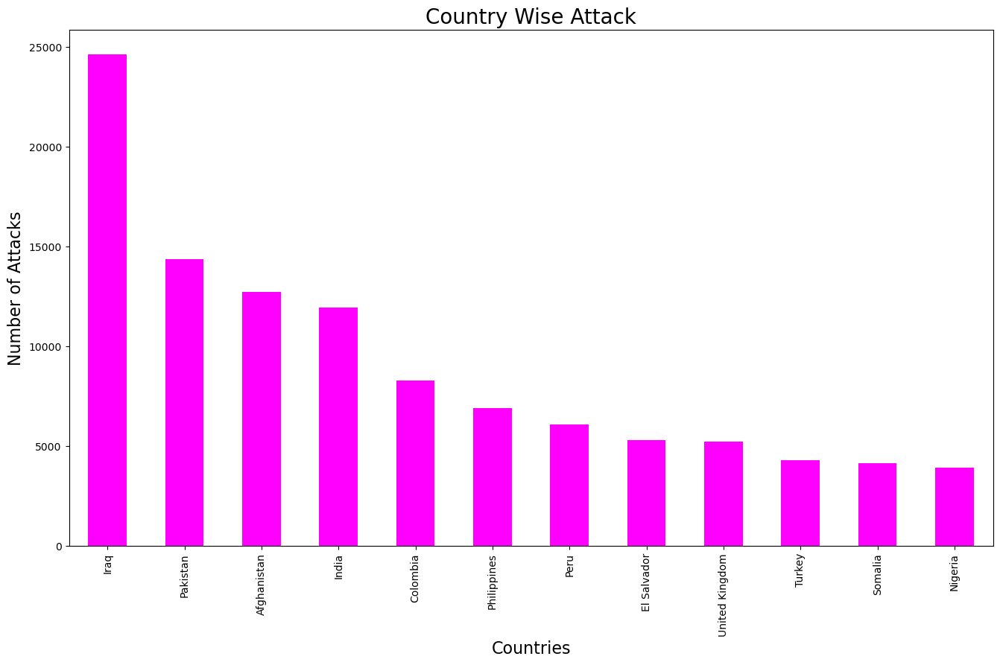

In [26]:
cy.plot(kind = 'bar', color = 'magenta',figsize = (16,9))
plt.xlabel('Countries', fontsize = 16)
plt.ylabel('Number of Attacks', fontsize = 16)
plt.title('Country Wise Attack', fontsize = 20)
plt.show()

# TOTAL CASUALITIES(KILLED+WOUNDED) IN EACH REGION

## CASUALTIES

In [27]:
Rc = data[['Region','Casualties']].groupby('Region').sum().sort_values(by = 'Casualties', ascending = False)
Rc

,Casualties
Region,
Middle East & North Africa,351950.0
South Asia,242679.0
Sub-Saharan Africa,131243.0
South America,45553.0
Southeast Asia,41896.0
Central America & Caribbean,37699.0
North America,26447.0
Western Europe,25026.0
Eastern Europe,19460.0


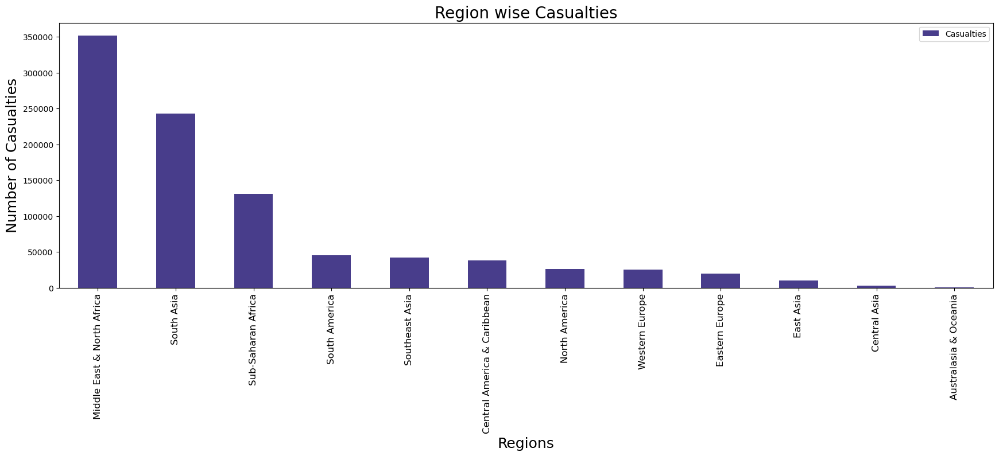

In [28]:
Rc.plot(kind="bar",color="darkslateblue",figsize=(21,6))
plt.title("Region wise Casualties",fontsize=20)
plt.xlabel("Regions",fontsize=18)
plt.xticks(fontsize=12)
plt.ylabel("Number of Casualties",fontsize=18)
plt.show()

# INSIGHTS OF CASUALTY

In [29]:
casualty=data.loc[:,"Casualties"].sum()
print("Total number of Casualties due to Terrorist Attacks from 1970 to 2017 across the world :\n",casualty)

Total number of Casualties due to Terrorist Attacks from 1970 to 2017 across the world :
 935737.0


## KILLED

In [30]:
Rk = data[['Region','kill']].groupby('Region').sum().sort_values(by = 'kill', ascending = False)
Rk

,kill
Region,
Middle East & North Africa,137642.0
South Asia,101319.0
Sub-Saharan Africa,78386.0
South America,28849.0
Central America & Caribbean,28708.0
Southeast Asia,15637.0
Eastern Europe,7415.0
Western Europe,6694.0
North America,4916.0


Text(0, 0.5, 'Number of People Killed')

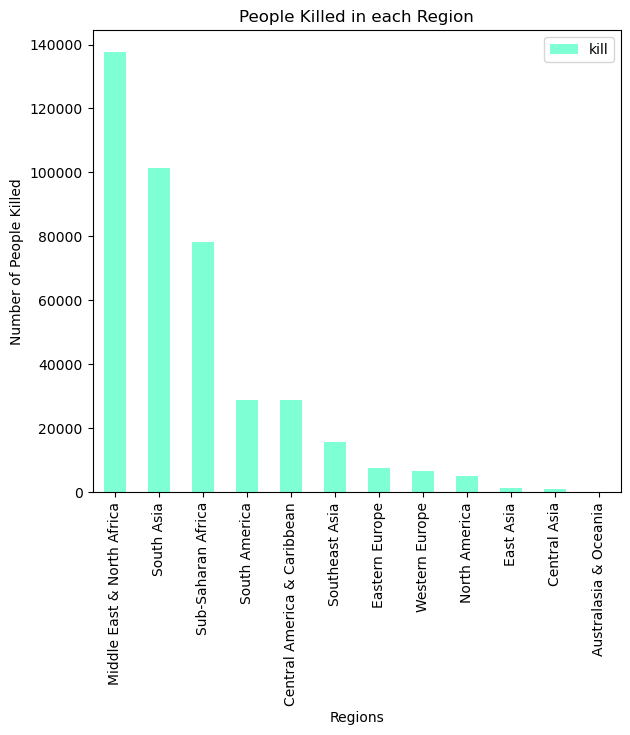

In [31]:
fig=plt.figure()
ax0=fig.add_subplot(1,2,1)
Rk.plot(kind="bar",color="aquamarine",figsize=(15,6),ax=ax0)
ax0.set_title("People Killed in each Region")
ax0.set_xlabel("Regions")
ax0.set_ylabel("Number of People Killed")


# INSIGHTS OF PEOPLES KILLED

In [32]:
Killed = data.loc[:,'kill'].sum()
print("Total number of peoples killed due to the Terrorist Attacks from 1970 t0 2017 across the world:\n",Killed)

Total number of peoples killed due to the Terrorist Attacks from 1970 t0 2017 across the world:
 411868.0


## WOUNDED

In [33]:
Rw = data[['Region','Wound']].groupby('Region').sum().sort_values(by = 'Wound', ascending = False)
Rw

,Wound
Region,
Middle East & North Africa,214308.0
South Asia,141360.0
Sub-Saharan Africa,52857.0
Southeast Asia,26259.0
North America,21531.0
Western Europe,18332.0
South America,16704.0
Eastern Europe,12045.0
East Asia,9213.0


Text(0, 0.5, 'Number of Peoples Wounded')

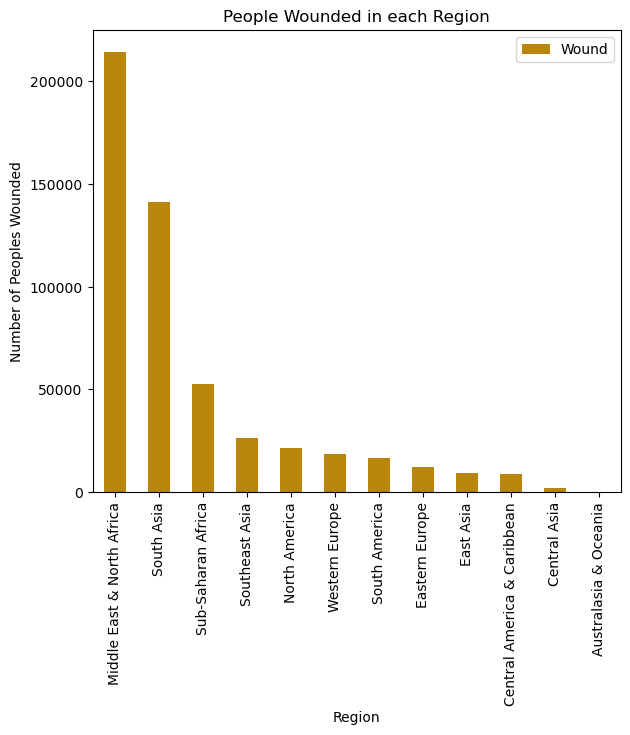

In [34]:
fig = plt.figure()
ax1 = fig.add_subplot(1,2,2)
Rw.plot(kind = 'bar', color = 'darkgoldenrod',figsize = (15,6),ax = ax1)
ax1.set_title("People Wounded in each Region")
ax1.set_xlabel('Region')
ax1.set_ylabel('Number of Peoples Wounded')

# INSIGHTS OF PEOPLES WOUNDED

In [35]:
Wounded = data.loc[:,'Wound'].sum()
print("Total number of people wounded due to Terrorist Attacks from 1970 to 2017 across the world :\n", Wounded)

Total number of people wounded due to Terrorist Attacks from 1970 to 2017 across the world :
 523869.0


# ATTACKTYPE WISE ATTACKS

In [36]:
att = data['Attacktype'].value_counts().head(5)

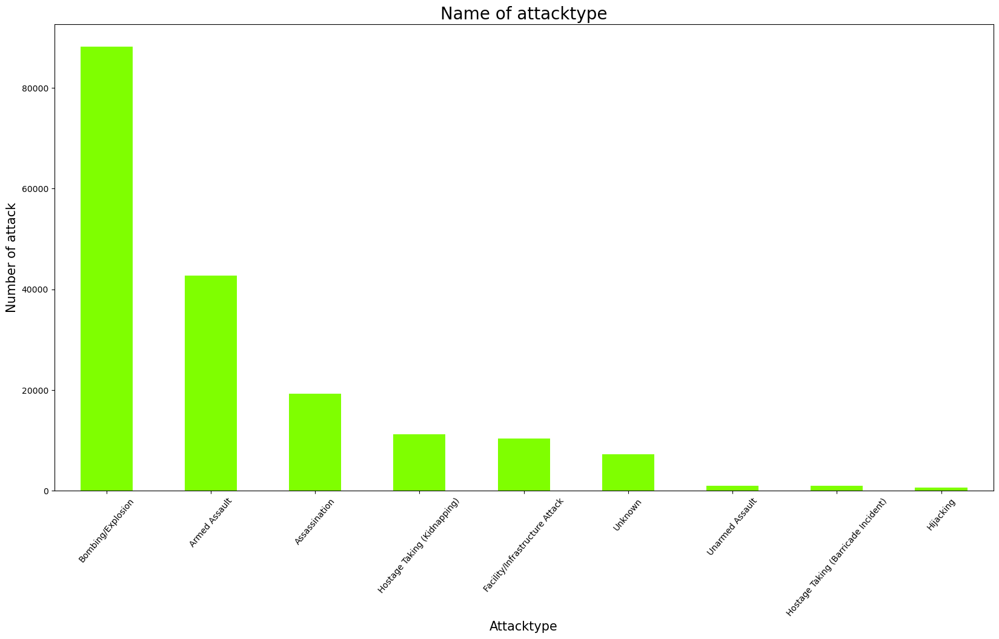

In [37]:
data['Attacktype'].value_counts().plot(kind='bar',figsize=(20,10),color='chartreuse')
plt.xticks(rotation = 50)
plt.xlabel("Attacktype",fontsize=15)
plt.ylabel("Number of attack",fontsize=15)
plt.title("Name of attacktype",fontsize=20)
plt.show()

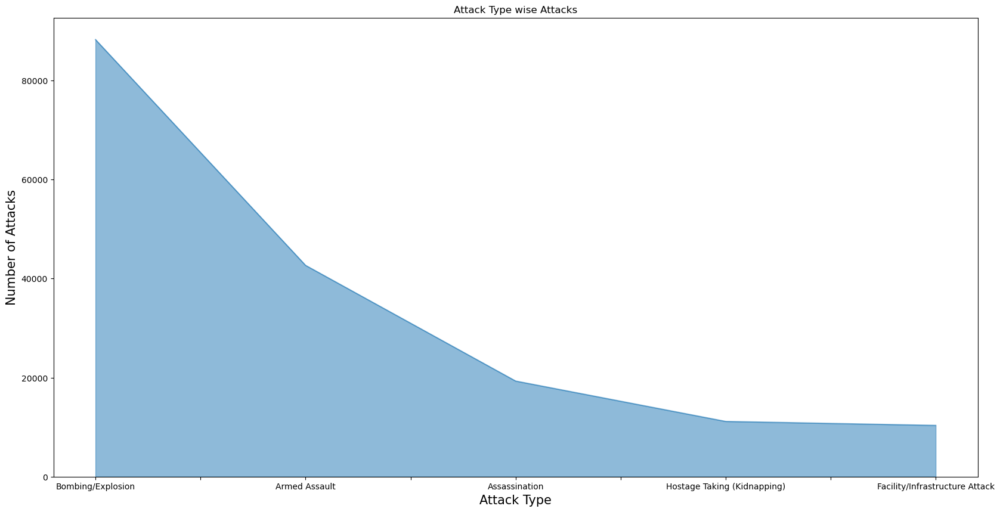

In [38]:
att.plot(kind = "area",stacked = False,alpha = 0.5,figsize = (20,10))
plt.title("Attack Type wise Attacks")
plt.xlabel("Attack Type",fontsize = 15)
plt.ylabel("Number of Attacks",fontsize = 15)
plt.show()

# WEAPON WISE ATTACKS

In [39]:
wp = data["Weapon"].value_counts().head(10)
wp

Explosives                                                                     92426
Firearms                                                                       58524
Unknown                                                                        15157
Incendiary                                                                     11135
Melee                                                                           3655
Chemical                                                                         321
Sabotage Equipment                                                               141
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)      136
Other                                                                            114
Biological                                                                        35
Name: Weapon, dtype: int64

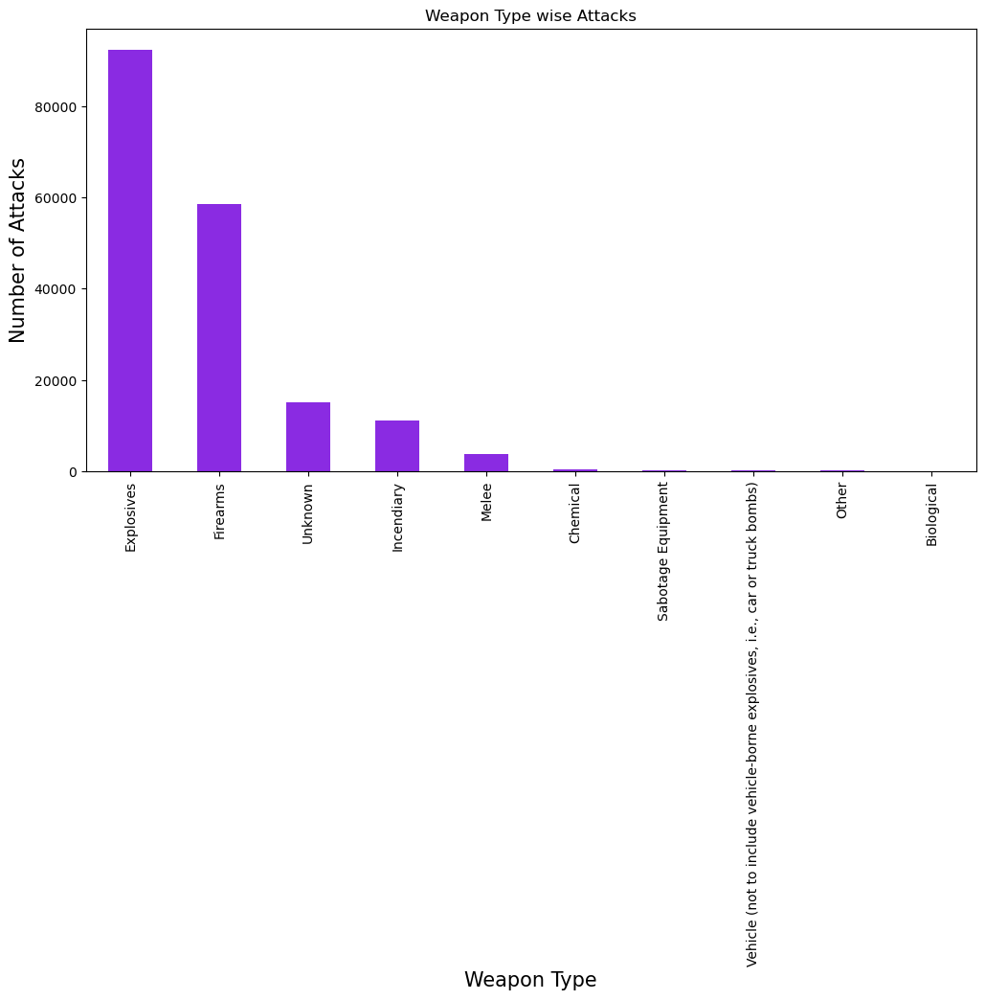

In [40]:
wp.plot(kind = "bar",color = "blueviolet",figsize = (12,6))
plt.title("Weapon Type wise Attacks")
plt.xlabel("Weapon Type",fontsize = 15)
plt.ylabel("Number of Attacks",fontsize = 15)
plt.show()

In [41]:
import folium
from folium.plugins import MarkerCluster 
filterYear = data['Year'] == 2014

In [42]:
filterData = data[filterYear] # filter data
# filterData.info()
reqFilterData = filterData.loc[:,'City':'longitude'] #We are getting the required fields
reqFilterData = reqFilterData.dropna() # drop NaN values in latitude and longitude
reqFilterDataList = reqFilterData.values.tolist()
# reqFilterDataList

# ATTACKS HAPPENED IN THE CITIES(WORLDWIDE)

In [43]:
map = folium.Map(location = [0, 30], tiles='CartoDB positron', zoom_start=2)
# clustered marker
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(reqFilterDataList)):
    folium.Marker(location=[reqFilterDataList[point][1],reqFilterDataList[point][2]],
                  popup = reqFilterDataList[point][0]).add_to(markerCluster)
map

# CONCLUSION


##### From the above analysis we conclude that

#### * Iraq country has highest number of attacks (24636)
#### * Middle and East Africa region has highest number of attacks (50474)
#### * Explosives are the most weapon used by terrorsits (92426).
#### * From the analysis we can see that on 2014 the number of terrorist activities were the highest in Iraq Country (16806)
#### * Private citizens and Property were the main targets in terrorism activity (43510)
#### * Bombing and Explosion methods were most commonly used in terrorism activity (82255).
#### * Taliban is most Notorious group with highest number of terrorist activitiies (7478)

### Strong security should be given for the countries Iraq,Pakistan,Afghanistan and India and also for middle East Regions and cities like Bhagdad,Karachi lima and many others.

### Safety measures have to take regarding explosive devices as bombing explosions are the most weapons used by terrorsits

### Strong security should be given to Private citizens and Property ,Military,Police etc as they are main target in terrorism